<a href="https://colab.research.google.com/github/Afzal786/Airflow-Diease-outbreak-project/blob/master/Covid19prediction.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
# importing the required libraries
import pandas as pd

# Visualisation libraries
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import folium 
from folium import plugins

# Manipulating the default plot size
plt.rcParams['figure.figsize'] = 10, 12

# Disable warnings 
import warnings
warnings.filterwarnings('ignore')

In [106]:
df= pd.read_csv('covid_19_data.csv')
df_india = df.copy()
df.tail()

,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered
19923,19924,04/29/2020,Wyoming,US,2020-04-30 02:32:27,545.0,7.0,0.0
19924,19925,04/29/2020,Xinjiang,Mainland China,2020-04-30 02:32:27,76.0,3.0,73.0
19925,19926,04/29/2020,Yukon,Canada,2020-04-30 02:32:27,11.0,0.0,0.0
19926,19927,04/29/2020,Yunnan,Mainland China,2020-04-30 02:32:27,185.0,2.0,181.0
19927,19928,04/29/2020,Zhejiang,Mainland China,2020-04-30 02:32:27,1268.0,1.0,1263.0


In [107]:
df.fillna(0)

,SNo,ObservationDate,Province/State,Country/Region,Last Update,Confirmed,Deaths,Recovered
0,1,01/22/2020,Anhui,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
1,2,01/22/2020,Beijing,Mainland China,1/22/2020 17:00,14.0,0.0,0.0
2,3,01/22/2020,Chongqing,Mainland China,1/22/2020 17:00,6.0,0.0,0.0
3,4,01/22/2020,Fujian,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
4,5,01/22/2020,Gansu,Mainland China,1/22/2020 17:00,0.0,0.0,0.0
5,6,01/22/2020,Guangdong,Mainland China,1/22/2020 17:00,26.0,0.0,0.0
6,7,01/22/2020,Guangxi,Mainland China,1/22/2020 17:00,2.0,0.0,0.0
7,8,01/22/2020,Guizhou,Mainland China,1/22/2020 17:00,1.0,0.0,0.0
8,9,01/22/2020,Hainan,Mainland China,1/22/2020 17:00,4.0,0.0,0.0
9,10,01/22/2020,Hebei,Mainland China,1/22/2020 17:00,1.0,0.0,0.0


In [0]:
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', None)
pd.set_option('display.max_colwidth', -1)


In [0]:
df_new = df.drop(columns = 'ConfirmedIndianNational')


In [0]:
df_new = df_new.drop(columns = 'ConfirmedForeignNational')

In [0]:
df_new

In [0]:
df_del =  df_new.loc[df["State/UnionTerritory"]=="Delhi"]

In [0]:
df_del

In [0]:
df_del['Total Active'] = df['Confirmed'] - (df['Deaths'] + df['Cured'])

In [0]:
from fbprophet import Prophet

In [0]:
active = df_del[['Date','Total Active']]

In [0]:
active 

In [0]:
confirmed.columns = ['ds','y']
#confirmed['ds'] = confirmed['ds'].dt.date
confirmed['ds'] = pd.to_datetime(confirmed['ds'])

In [0]:
active.columns = ['ds','y']

#confirmed['ds'] = confirmed['ds'].dt.date
active['ds'] = pd.to_datetime(active['ds'])

In [0]:
active

In [0]:
m = Prophet(interval_width=0.95)
m.fit(active)
future = m.make_future_dataframe(periods=100)
future.tail()

In [0]:
forecast = m.predict(future)
forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

In [0]:
confirmed_forecast_plot = m.plot(forecast)

In [0]:
confirmed_forecast_plot =m.plot_components(forecast)

In [0]:
import numpy as np 
import matplotlib.pyplot as plt 
import matplotlib.colors as mcolors
import pandas as pd 
import random
import math
import time
import xgboost
from sklearn.linear_model import LinearRegression, BayesianRidge
from sklearn.model_selection import RandomizedSearchCV, train_test_split
from sklearn.preprocessing import PolynomialFeatures
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
from sklearn.metrics import mean_squared_error, mean_absolute_error
import datetime
import operator 
plt.style.use('fivethirtyeight')
%matplotlib inline

In [0]:
confirmed_df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv')
deaths_df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv')
recoveries_df = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_recovered_global.csv')
latest_data = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports/04-26-2020.csv')
us_medical_data = pd.read_csv('https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_daily_reports_us/04-26-2020.csv')

In [0]:
unique_country =  list(latest_data['Country_Region'].unique())

In [4]:
latest_data.head()

,FIPS,Admin2,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Combined_Key
0,45001.0,Abbeville,South Carolina,US,2020-04-27 02:30:52,34.223334,-82.461707,27,0,0,27,"Abbeville, South Carolina, US"
1,22001.0,Acadia,Louisiana,US,2020-04-27 02:30:52,30.295065,-92.414197,130,7,0,123,"Acadia, Louisiana, US"
2,51001.0,Accomack,Virginia,US,2020-04-27 02:30:52,37.767072,-75.632346,187,3,0,184,"Accomack, Virginia, US"
3,16001.0,Ada,Idaho,US,2020-04-27 02:30:52,43.452658,-116.241552,650,15,0,635,"Ada, Idaho, US"
4,19001.0,Adair,Iowa,US,2020-04-27 02:30:52,41.330756,-94.471059,1,0,0,1,"Adair, Iowa, US"


In [88]:
latest_data.loc[latest_data["Country_Region"]=="China"]

,FIPS,Admin2,Province_State,Country_Region,Last_Update,Lat,Long_,Confirmed,Deaths,Recovered,Active,Combined_Key
2876,NaN,NaN,Anhui,China,2020-04-24 12:04:47,31.8257,117.2264,991,6,985,0,"Anhui, China"
2878,NaN,NaN,Beijing,China,2020-04-27 01:12:14,40.1824,116.4142,593,9,525,59,"Beijing, China"
2885,NaN,NaN,Chongqing,China,2020-04-24 00:43:27,30.0572,107.8740,579,6,573,0,"Chongqing, China"
2893,NaN,NaN,Fujian,China,2020-04-25 01:01:53,26.0789,117.9874,355,1,349,5,"Fujian, China"
2894,NaN,NaN,Gansu,China,2020-04-16 13:44:14,37.8099,101.0583,139,2,137,0,"Gansu, China"
2900,NaN,NaN,Guangdong,China,2020-04-27 01:21:22,23.3417,113.4244,1587,8,1542,37,"Guangdong, China"
2901,NaN,NaN,Guangxi,China,2020-04-02 00:16:02,23.8298,108.7881,254,2,252,0,"Guangxi, China"
2902,NaN,NaN,Guizhou,China,2020-04-19 00:51:07,26.8154,106.8748,147,2,145,0,"Guizhou, China"
2903,NaN,NaN,Hainan,China,2020-03-24 04:19:14,19.1959,109.7453,168,6,162,0,"Hainan, China"
2904,NaN,NaN,Hebei,China,2020-04-25 00:34:20,39.5490,116.1306,328,6,318,4,"Hebei, China"


In [94]:
china_confirmed_p

,Province/State,Country/Region,Lat,Long,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,...,3/22/20,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20,4/23/20,4/24/20,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20,4/30/20
49,Anhui,China,31.8257,117.2264,1,9,15,39,60,70,106,152,200,237,297,340,408,480,530,591,665,733,779,830,860,889,910,934,950,962,973,982,986,987,988,989,989,989,989,989,...,990,990,990,990,990,990,990,990,990,990,990,990,990,990,990,990,990,990,991,991,991,991,991,991,991,991,991,991,991,991,991,991,991,991,991,991,991,991,991,991
50,Beijing,China,40.1824,116.4142,14,22,36,41,68,80,91,111,114,139,168,191,212,228,253,274,297,315,326,337,342,352,366,372,375,380,381,387,393,395,396,399,399,399,400,400,...,522,537,558,561,566,569,573,577,577,580,580,582,584,585,586,587,587,588,588,588,589,589,589,589,590,593,593,593,593,593,593,593,593,593,593,593,593,593,593,593
51,Chongqing,China,30.0572,107.8740,6,9,27,57,75,110,132,147,182,211,247,300,337,366,389,411,426,428,468,486,505,518,529,537,544,551,553,555,560,567,572,573,575,576,576,576,...,577,578,578,578,578,578,578,579,579,579,579,579,579,579,579,579,579,579,579,579,579,579,579,579,579,579,579,579,579,579,579,579,579,579,579,579,579,579,579,579
52,Fujian,China,26.0789,117.9874,1,5,10,18,35,59,80,84,101,120,144,159,179,194,205,215,224,239,250,261,267,272,279,281,285,287,290,292,293,293,293,293,293,293,294,294,...,313,313,318,322,328,331,337,338,340,343,345,345,349,350,350,350,351,351,351,351,351,352,352,353,353,353,354,355,355,355,355,355,355,355,355,355,355,355,355,356
53,Gansu,China,37.8099,101.0583,0,2,2,4,7,14,19,24,26,29,40,51,55,57,62,62,67,79,83,83,86,87,90,90,90,90,91,91,91,91,91,91,91,91,91,91,...,136,136,136,136,136,136,136,138,138,138,138,138,138,138,138,139,139,139,139,139,139,139,139,139,139,139,139,139,139,139,139,139,139,139,139,139,139,139,139,139
54,Guangdong,China,23.3417,113.4244,26,32,53,78,111,151,207,277,354,436,535,632,725,813,895,970,1034,1095,1131,1159,1177,1219,1241,1261,1294,1316,1322,1328,1331,1332,1333,1339,1342,1345,1347,1347,...,1413,1415,1428,1433,1448,1456,1467,1475,1484,1494,1501,1507,1514,1516,1524,1532,1533,1536,1539,1544,1548,1552,1555,1564,1566,1571,1577,1579,1580,1581,1582,1582,1585,1585,1586,1587,1587,1588,1588,1588
55,Guangxi,China,23.8298,108.7881,2,5,23,23,36,46,51,58,78,87,100,111,127,139,150,168,172,183,195,210,215,222,222,226,235,237,238,242,244,245,246,249,249,251,252,252,...,254,254,254,254,254,254,254,254,254,254,254,254,254,254,254,254,254,254,254,254,254,254,254,254,254,254,254,254,254,254,254,254,254,254,254,254,254,254,254,254
56,Guizhou,China,26.8154,106.8748,1,3,3,4,5,7,9,9,12,29,29,38,46,58,64,71,81,89,99,109,127,133,135,140,143,144,146,146,146,146,146,146,146,146,146,146,...,146,146,146,146,146,146,146,146,146,146,146,146,146,146,146,146,146,146,146,146,146,146,146,146,146,146,146,146,147,147,147,147,147,147,147,147,147,147,147,147
57,Hainan,China,19.1959,109.7453,4,5,8,19,22,33,40,43,46,52,62,64,72,80,99,106,117,124,131,138,144,157,157,159,162,162,163,163,168,168,168,168,168,168,168,168,...,168,168,168,168,168,168,168,168,168,168,168,168,168,168,168,168,168,168,168,168,168,168,168,168,168,168,168,168,168,168,168,168,168,168,168,168,168,168,168,168
58,Hebei,China,39.5490,116.1306,1,1,2,8,13,18,33,48,65,82,96,104,113,126,135,157,172,195,206,218,239,251,265,283,291,300,301,306,306,307,308,309,311,311,311,312,...,319,319,319,319,319,319,319,319,321,321,323,325,326,326,327,327,327,327,327,327,327,327,327,327,327,328,328,328,328,328,328,328,328,328,328,328,328,328,328,328


In [0]:
china_confirmed_p = confirmed_df.loc[confirmed_df["Country/Region"]=="China"]
china_confirmed_p = china_confirmed_p.loc[confirmed_df["Province/State"]=="Hong Kong"]
china_deaths_p = confirmed_df.loc[confirmed_df["Country/Region"]=="China"]
china_deaths_p = china_deaths_p.loc[confirmed_df["Province/State"]=="Hong Kong"]
china_recoveries_p = confirmed_df.loc[confirmed_df["Country/Region"]=="China"]
china_recoveries_p = china_recoveries_p.loc[confirmed_df["Province/State"]=="Hong Kong"]

In [0]:

confirmed = china_confirmed_p.iloc[:, 4:-1]
deaths = china_deaths_p.iloc[:, 4:-1]
recoveries = china_recoveries_p.iloc[:, 4:-1]

In [7]:
confirmed

,1/22/20,1/23/20,1/24/20,1/25/20,1/26/20,1/27/20,1/28/20,1/29/20,1/30/20,1/31/20,2/1/20,2/2/20,2/3/20,2/4/20,2/5/20,2/6/20,2/7/20,2/8/20,2/9/20,2/10/20,2/11/20,2/12/20,2/13/20,2/14/20,2/15/20,2/16/20,2/17/20,2/18/20,2/19/20,2/20/20,2/21/20,2/22/20,2/23/20,2/24/20,2/25/20,2/26/20,2/27/20,2/28/20,2/29/20,3/1/20,...,3/21/20,3/22/20,3/23/20,3/24/20,3/25/20,3/26/20,3/27/20,3/28/20,3/29/20,3/30/20,3/31/20,4/1/20,4/2/20,4/3/20,4/4/20,4/5/20,4/6/20,4/7/20,4/8/20,4/9/20,4/10/20,4/11/20,4/12/20,4/13/20,4/14/20,4/15/20,4/16/20,4/17/20,4/18/20,4/19/20,4/20/20,4/21/20,4/22/20,4/23/20,4/24/20,4/25/20,4/26/20,4/27/20,4/28/20,4/29/20
61,0,2,2,5,8,8,8,10,10,12,13,15,15,17,21,24,25,26,29,38,49,50,53,56,56,57,60,62,63,68,68,69,74,79,84,91,92,94,95,96,...,273,317,356,386,410,453,519,561,641,682,714,765,802,845,862,890,914,935,960,973,989,1000,1004,1009,1012,1017,1017,1021,1024,1025,1025,1029,1033,1035,1035,1037,1037,1037,1037,1037


In [8]:
dates = confirmed.keys()
world_cases = []
total_deaths = [] 
mortality_rate = []
recovery_rate = [] 
total_recovered = [] 
total_active = [] 


for i in dates:
    confirmed_sum = confirmed[i].sum()
    death_sum = deaths[i].sum()
    recovered_sum = recoveries[i].sum()
    
    # confirmed, deaths, recovered, and active
    world_cases.append(confirmed_sum)
    total_deaths.append(death_sum)
    total_recovered.append(recovered_sum)
    total_active.append(confirmed_sum-death_sum-recovered_sum)
    
    # calculate rates
    mortality_rate.append(death_sum/confirmed_sum)
    recovery_rate.append(recovered_sum/confirmed_sum)

    

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:22: RuntimeWarning: invalid value encountered in long_scalars
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:23: RuntimeWarning: invalid value encountered in long_scalars


In [0]:
def daily_increase(data):
    d = [] 
    for i in range(len(data)):
        if i == 0:
            d.append(data[0])
        else:
            d.append(data[i]-data[i-1])
    return d 

# confirmed cases
world_daily_increase = daily_increase(world_cases)


# deaths
world_daily_death = daily_increase(total_deaths)


# recoveries
world_daily_recovery = daily_increase(total_recovered)

world_daily_active = daily_increase(total_active)

In [33]:
world_daily_increase

[0,
 2,
 0,
 3,
 3,
 0,
 0,
 2,
 0,
 2,
 1,
 2,
 0,
 2,
 4,
 3,
 1,
 1,
 3,
 9,
 11,
 1,
 3,
 3,
 0,
 1,
 3,
 2,
 1,
 5,
 0,
 1,
 5,
 5,
 5,
 7,
 1,
 2,
 1,
 1,
 4,
 0,
 5,
 0,
 2,
 1,
 6,
 1,
 5,
 6,
 3,
 5,
 6,
 5,
 10,
 7,
 19,
 27,
 48,
 17,
 44,
 39,
 30,
 24,
 43,
 66,
 42,
 80,
 41,
 32,
 51,
 37,
 43,
 17,
 28,
 24,
 21,
 25,
 13,
 16,
 11,
 4,
 5,
 3,
 5,
 0,
 4,
 3,
 1,
 0,
 4,
 4,
 2,
 0,
 2,
 0,
 0,
 0,
 0]

In [11]:
world_cases

[0,
 2,
 2,
 5,
 8,
 8,
 8,
 10,
 10,
 12,
 13,
 15,
 15,
 17,
 21,
 24,
 25,
 26,
 29,
 38,
 49,
 50,
 53,
 56,
 56,
 57,
 60,
 62,
 63,
 68,
 68,
 69,
 74,
 79,
 84,
 91,
 92,
 94,
 95,
 96,
 100,
 100,
 105,
 105,
 107,
 108,
 114,
 115,
 120,
 126,
 129,
 134,
 140,
 145,
 155,
 162,
 181,
 208,
 256,
 273,
 317,
 356,
 386,
 410,
 453,
 519,
 561,
 641,
 682,
 714,
 765,
 802,
 845,
 862,
 890,
 914,
 935,
 960,
 973,
 989,
 1000,
 1004,
 1009,
 1012,
 1017,
 1017,
 1021,
 1024,
 1025,
 1025,
 1029,
 1033,
 1035,
 1035,
 1037,
 1037,
 1037,
 1037,
 1037]

In [0]:
days_since_1_22 = np.array([i for i in range(len(dates))]).reshape(-1, 1)
world_cases = np.array(world_cases).reshape(-1, 1)
total_deaths = np.array(total_deaths).reshape(-1, 1)
total_recovered = np.array(total_recovered).reshape(-1, 1)

In [0]:
days_in_future = 1000
future_forcast = np.array([i for i in range(len(dates)+days_in_future)]).reshape(-1, 1)
adjusted_dates = future_forcast[:-1000]

In [0]:
start = '1/22/2020'
start_date = datetime.datetime.strptime(start, '%m/%d/%Y')
future_forcast_dates = []
for i in range(len(future_forcast)):
    future_forcast_dates.append((start_date + datetime.timedelta(days=i)).strftime('%m/%d/%Y'))

In [0]:
X_train_confirmed, X_test_confirmed, y_train_confirmed, y_test_confirmed = train_test_split(days_since_1_22, world_daily_increase, test_size=0.20, shuffle=False)

In [0]:
X_train_confirmed

In [17]:
len(world_cases)

99

In [20]:
# # use this to find the optimal parameters for SVR
c = [0.01, 0.1, 1]
gamma = [0.01, 0.1, 1]
epsilon = [0.01, 0.1, 1]
shrinking = [True, False]
degree = [3, 4, 5]

svm_grid = {'C': c, 'gamma' : gamma, 'epsilon': epsilon, 'shrinking' : shrinking, 'degree': degree}

svm = SVR(kernel='poly')
svm_search = RandomizedSearchCV(svm, svm_grid, scoring='neg_mean_squared_error', cv=3, return_train_score=True, n_jobs=-1, n_iter=1, verbose=1)
svm_search.fit(X_train_confirmed, y_train_confirmed)

Fitting 3 folds for each of 1 candidates, totalling 3 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done   3 out of   3 | elapsed:   54.3s finished


RandomizedSearchCV(cv=3, error_score=nan,
                   estimator=SVR(C=1.0, cache_size=200, coef0=0.0, degree=3,
                                 epsilon=0.1, gamma='scale', kernel='poly',
                                 max_iter=-1, shrinking=True, tol=0.001,
                                 verbose=False),
                   iid='deprecated', n_iter=1, n_jobs=-1,
                   param_distributions={'C': [0.01, 0.1, 1],
                                        'degree': [3, 4, 5],
                                        'epsilon': [0.01, 0.1, 1],
                                        'gamma': [0.01, 0.1, 1],
                                        'shrinking': [True, False]},
                   pre_dispatch='2*n_jobs', random_state=None, refit=True,
                   return_train_score=True, scoring='neg_mean_squared_error',
                   verbose=1)

In [21]:
svm_search.best_params_

{'C': 0.1, 'degree': 5, 'epsilon': 0.1, 'gamma': 0.01, 'shrinking': False}

/usr/local/lib/python3.6/dist-packages/sklearn/utils/validation.py:760: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


MAE: 1177.9734055914962
MSE: 1849166.361729584


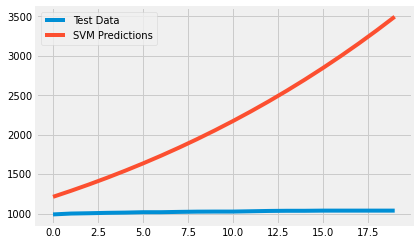

In [26]:
svm_confirmed = SVR(shrinking=False, kernel='poly',gamma=0.01, epsilon=0.1,degree=5, C=0.1)
svm_confirmed.fit(X_train_confirmed, y_train_confirmed)
svm_pred = svm_confirmed.predict(future_forcast)
svm_test_pred = svm_confirmed.predict(X_test_confirmed)
plt.plot(y_test_confirmed)
plt.plot(svm_test_pred)
plt.legend(['Test Data', 'SVM Predictions'])
print('MAE:', mean_absolute_error(svm_test_pred, y_test_confirmed))
print('MSE:',mean_squared_error(svm_test_pred, y_test_confirmed))

MAE: 29.345522485254804
MSE: 893.3783939506382
MAE: 2197.7734055914966
MSE: 5312739.593276865


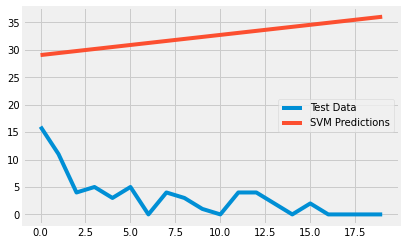

In [35]:
linear_model = LinearRegression(normalize=True, fit_intercept=False)
linear_model.fit(X_train_confirmed, y_train_confirmed)
test_linear_pred = linear_model.predict(X_test_confirmed)
linear_pred = linear_model.predict(future_forcast)
print('MAE:', mean_absolute_error(test_linear_pred, y_test_confirmed))
print('MSE:',mean_squared_error(test_linear_pred, y_test_confirmed))


plt.plot(y_test_confirmed)
plt.plot(test_linear_pred)
plt.legend(['Test Data', 'SVM Predictions'])
print('MAE:', mean_absolute_error(svm_test_pred, y_test_confirmed))
print('MSE:',mean_squared_error(svm_test_pred, y_test_confirmed))

In [0]:
poly = PolynomialFeatures(degree=3)
poly_X_train_confirmed = poly.fit_transform(X_train_confirmed)
poly_X_test_confirmed = poly.fit_transform(X_test_confirmed)
poly_future_forcast = poly.fit_transform(future_forcast)

bayesian_poly = PolynomialFeatures(degree=4)
bayesian_poly_X_train_confirmed = bayesian_poly.fit_transform(X_train_confirmed)
bayesian_poly_X_test_confirmed = bayesian_poly.fit_transform(X_test_confirmed)
bayesian_poly_future_forcast = bayesian_poly.fit_transform(future_forcast)

In [53]:
linear_model = LinearRegression(normalize=True, fit_intercept=False)
linear_model.fit(poly_X_train_confirmed, y_train_confirmed)
test_linear_pred = linear_model.predict(poly_X_test_confirmed)
linear_pred = linear_model.predict(poly_future_forcast)
print('MAE:', mean_absolute_error(test_linear_pred, y_test_confirmed))
print('MSE:',mean_squared_error(test_linear_pred, y_test_confirmed))

MAE: 441275.69308855553
MSE: 324355347434.8247


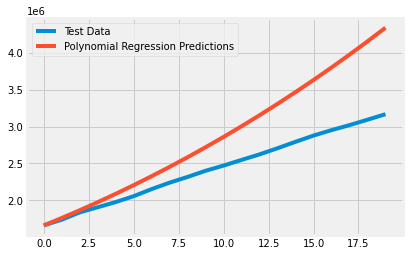

In [54]:
plt.plot(y_test_confirmed)
plt.plot(test_linear_pred)
plt.legend(['Test Data', 'Polynomial Regression Predictions'])


In [0]:
adjusted_dates = adjusted_dates.reshape(1, -1)[0]
plt.figure(figsize=(16, 9))
plt.plot(adjusted_dates, world_cases)
plt.title('# of Coronavirus Cases Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

plt.figure(figsize=(16, 9))
plt.plot(adjusted_dates, total_deaths)
plt.title('# of Coronavirus Deaths Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

plt.figure(figsize=(16, 9))
plt.plot(adjusted_dates, total_recovered)
plt.title('# of Coronavirus Recoveries Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()

plt.figure(figsize=(16, 9))
plt.plot(adjusted_dates, total_active)
plt.title('# of Coronavirus Active Cases Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Active Cases', size=30)
plt.xticks(size=20)
plt.yticks(size=20)
plt.show()


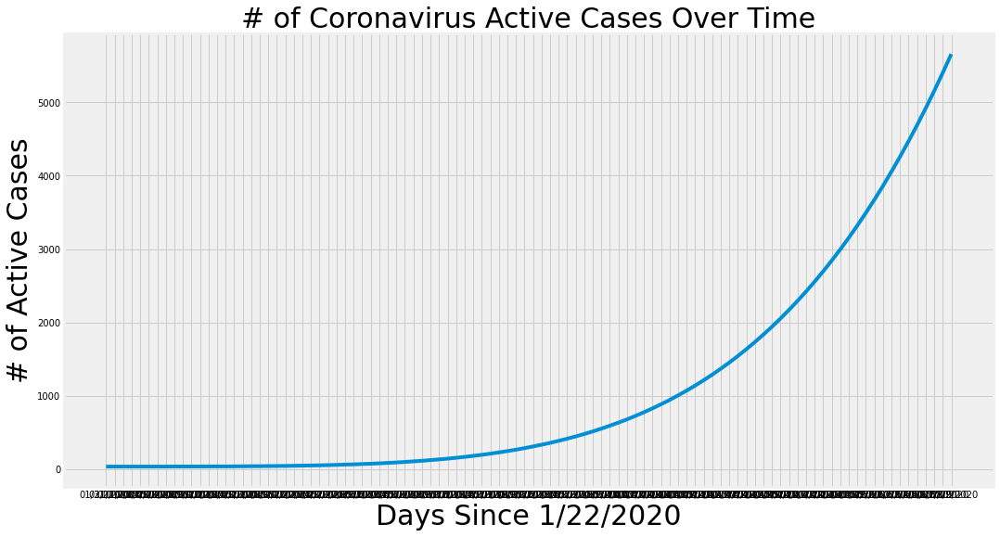

In [36]:
plt.figure(figsize=(16, 9))
plt.plot(future_forcast_dates[-100:], np.round(svm_pred[-100:]))
plt.title('# of Coronavirus Active Cases Over Time', size=30)
plt.xlabel('Days Since 1/22/2020', size=30)
plt.ylabel('# of Active Cases', size=30)
plt.xticks(size=10)
plt.yticks(size=10)
plt.show()

In [37]:
svm_df = pd.DataFrame({'Date': future_forcast_dates[-100:], 'SVM Predicted # of Confirmed Cases Worldwide': np.round(svm_pred[-100:])})
svm_df

,Date,SVM Predicted # of Confirmed Cases Worldwide
0,01/31/2020,34.0
1,02/01/2020,34.0
2,02/02/2020,34.0
3,02/03/2020,34.0
4,02/04/2020,34.0
...,...,...
95,05/05/2020,4692.0
96,05/06/2020,4920.0
97,05/07/2020,5157.0
98,05/08/2020,5404.0


In [0]:

unique_countries =  list(latest_data['Country_Region'].unique())

In [0]:
country_confirmed_cases = []
country_death_cases = [] 
country_active_cases = []
country_recovery_cases = []
country_mortality_rate = [] 

no_cases = []
for i in unique_countries:
    cases = latest_data[latest_data['Country_Region']==i]['Confirmed'].sum()
    if cases > 0:
        country_confirmed_cases.append(cases)
    else:
        no_cases.append(i)
        
for i in no_cases:
    unique_countries.remove(i)
    
# sort countries by the number of confirmed cases
unique_countries = [k for k, v in sorted(zip(unique_countries, country_confirmed_cases), key=operator.itemgetter(1), reverse=True)]
for i in range(len(unique_countries)):
    country_confirmed_cases[i] = latest_data[latest_data['Country_Region']==unique_countries[i]]['Confirmed'].sum()
    country_death_cases.append(latest_data[latest_data['Country_Region']==unique_countries[i]]['Deaths'].sum())
    country_recovery_cases.append(latest_data[latest_data['Country_Region']==unique_countries[i]]['Recovered'].sum())
    country_active_cases.append(country_confirmed_cases[i] - country_death_cases[i] - country_recovery_cases[i])
    country_mortality_rate.append(country_death_cases[i]/country_confirmed_cases[i])